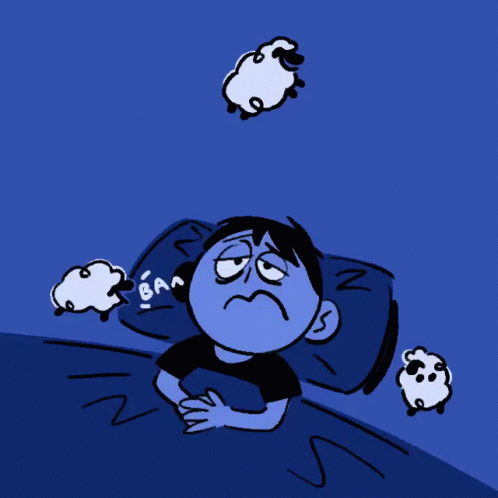

#<b>Data features<b>

Person ID: An identifier for each individual

Gender: The gender of the person (Male/Female)

Age: The age of the person in years

Occupation: The occupation or profession of the person

Sleep Duration (hours): The number of hours the person sleeps per day

Quality of Sleep (scale: 1-10): A subjective rating of the quality of sleep, ranging from 1 to 10

Physical Activity Level (minutes/day): The number of minutes the person engages in physical activity daily

Stress Level (scale: 1-10): A subjective rating of the stress level experienced by the person, ranging from 1 to 10

BMI Category: The BMI category of the person (e.g., Underweight, Normal, Overweight)

Blood Pressure (systolic/diastolic): The blood pressure measurement of the person, indicated as systolic pressure over diastolic pressure

Heart Rate (bpm): The resting heart rate of the person in beats per minute

Daily Steps: The number of steps the person takes per day

Sleep Disorder: The presence or absence of a sleep disorder in the person (None, Insomnia, Sleep Apnea)



#<b>The classes we have<b>

None: The individual does not exhibit any specific sleep disorder

Insomnia: The individual experiences difficulty falling asleep or staying asleep, leading to inadequate or poor-quality sleep

Sleep Apnea: The individual suffers from pauses in breathing during sleep, resulting in disrupted sleep patterns and potential health risks

#<b>Importing libraries<b>


In [55]:
# Reading data
import pandas as pd


# Fixings warnings
import warnings
warnings.filterwarnings('ignore')


# For mathematical operations
import numpy as np


# Visualisation
import seaborn as sns
import plotly.express as px
from termcolor import colored
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.figure_factory as ff


# Data spliting
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

# for converting non-numeric data (String or Boolean) into numbers
from sklearn.preprocessing import LabelEncoder


from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier


# Evaluations
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import recall_score, precision_score, auc, roc_curve, f1_score, classification_report
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

#<b>Loading and reading data<b>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [56]:
sleep_data=pd.read_csv('/content/drive/MyDrive/Sleep Health and Lifestyle/Sleep_health_and_lifestyle_dataset.csv')

sleep_data.head().style.set_properties(**{'background-color': '#4A235A','color': '#E2EEF3'})

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,27,Software Engineer,6.100000,6,42,6,Overweight,126/83,77,4200,nan
1,2,Male,28,Doctor,6.200000,6,60,8,Normal,125/80,75,10000,nan
2,3,Male,28,Doctor,6.200000,6,60,8,Normal,125/80,75,10000,nan
3,4,Male,28,Sales Representative,5.900000,4,30,8,Obese,140/90,85,3000,Sleep Apnea
4,5,Male,28,Sales Representative,5.900000,4,30,8,Obese,140/90,85,3000,Sleep Apnea


#<b>Statistical information<b>


In [4]:
shape = sleep_data.shape
print('The dimention of data is :',shape)

The dimention of data is : (374, 13)


In [5]:
sleep_data.info()
# here we can see that we don't have any null value

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374 entries, 0 to 373
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Person ID                374 non-null    int64  
 1   Gender                   374 non-null    object 
 2   Age                      374 non-null    int64  
 3   Occupation               374 non-null    object 
 4   Sleep Duration           374 non-null    float64
 5   Quality of Sleep         374 non-null    int64  
 6   Physical Activity Level  374 non-null    int64  
 7   Stress Level             374 non-null    int64  
 8   BMI Category             374 non-null    object 
 9   Blood Pressure           374 non-null    object 
 10  Heart Rate               374 non-null    int64  
 11  Daily Steps              374 non-null    int64  
 12  Sleep Disorder           155 non-null    object 
dtypes: float64(1), int64(7), object(5)
memory usage: 38.1+ KB


In [6]:
# describe of numeric columns
sleep_data.describe().style.background_gradient(cmap='BuPu')

,Person ID,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,Heart Rate,Daily Steps
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,187.500000,42.184492,7.132086,7.312834,59.171123,5.385027,70.165775,6816.844920
std,108.108742,8.673133,0.795657,1.196956,20.830804,1.774526,4.135676,1617.915679
min,1.000000,27.000000,5.800000,4.000000,30.000000,3.000000,65.000000,3000.000000
25%,94.250000,35.250000,6.400000,6.000000,45.000000,4.000000,68.000000,5600.000000
50%,187.500000,43.000000,7.200000,7.000000,60.000000,5.000000,70.000000,7000.000000
75%,280.750000,50.000000,7.800000,8.000000,75.000000,7.000000,72.000000,8000.000000
max,374.000000,59.000000,8.500000,9.000000,90.000000,8.000000,86.000000,10000.000000


In [7]:
# describe of non-numeric columns
sleep_data.describe(include='O').style.set_properties(**{'background-color': '#4A235A','color': '#E2EEF3'})

,Gender,Occupation,BMI Category,Blood Pressure,Sleep Disorder
count,374,374,374,374,155
unique,2,11,4,25,2
top,Male,Nurse,Normal,130/85,Sleep Apnea
freq,189,73,195,99,78


#<b>Exploratory Data Analysis<b>

In [8]:
columns_name = sleep_data.columns

print(columns_name)

Index(['Person ID', 'Gender', 'Age', 'Occupation', 'Sleep Duration',
       'Quality of Sleep', 'Physical Activity Level', 'Stress Level',
       'BMI Category', 'Blood Pressure', 'Heart Rate', 'Daily Steps',
       'Sleep Disorder'],
      dtype='object')


In [9]:
number_of_values = sleep_data.nunique()

print(number_of_values)

Person ID                  374
Gender                       2
Age                         31
Occupation                  11
Sleep Duration              27
Quality of Sleep             6
Physical Activity Level     16
Stress Level                 6
BMI Category                 4
Blood Pressure              25
Heart Rate                  19
Daily Steps                 20
Sleep Disorder               2
dtype: int64


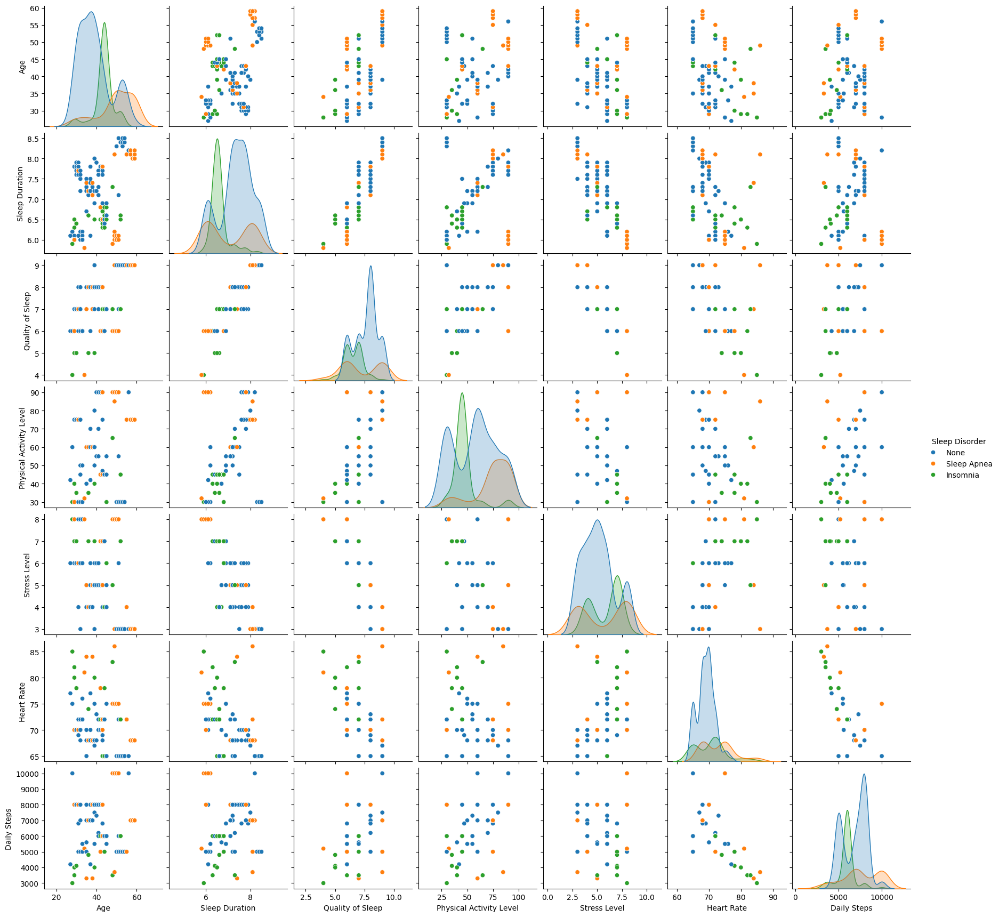

In [10]:
# show pair plot
sleep_data1 = sleep_data
sleep_data1['Sleep Disorder'] = sleep_data1['Sleep Disorder'].fillna('None')
sns.pairplot(data=sleep_data1.drop('Person ID',axis=1),hue='Sleep Disorder')
plt.show()

In [11]:
# find unique values of Sleep Disorder
classes = sleep_data1['Sleep Disorder'].unique()

print('The outputs from the classification are :',classes)

The outputs from the classification are : ['None' 'Sleep Apnea' 'Insomnia']


In [12]:
# show number of each class
sleep_data1['Sleep Disorder'].value_counts()

Sleep Disorder
None           219
Sleep Apnea     78
Insomnia        77
Name: count, dtype: int64

In [13]:
# show number of each class in histogram
fig=px.histogram(sleep_data,x='Sleep Disorder',
                 barmode="relative",
                 color='Sleep Disorder',
                 color_discrete_sequence=['pink','#4A235A','#C39BD3'],
                 text_auto=True)

fig.update_layout(title='<b>Distribution of persons have sleep disorder or not</b>..',
                 title_font={'size':25},
                 paper_bgcolor='#EBDEF0',
                 plot_bgcolor='#EBDEF0',
                 showlegend=True)


fig.update_yaxes(showgrid=False)

fig.show()

In [14]:
# show unique values of Gender
Gender = sleep_data['Gender'].unique()

print('The values of Sex column are :',Gender)

The values of Sex column are : ['Male' 'Female']


In [15]:
# find number of Male and Female in each class
sleep_data.groupby('Sleep Disorder')['Gender'].value_counts()

Sleep Disorder  Gender
Insomnia        Male       41
                Female     36
None            Male      137
                Female     82
Sleep Apnea     Female     67
                Male       11
Name: count, dtype: int64

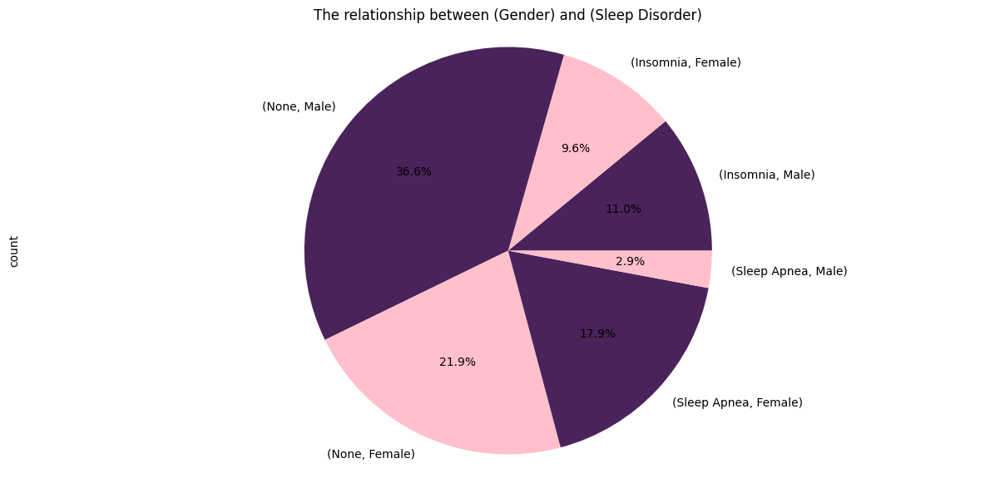

In [16]:
# show relation of Gender and Sleep Disorder in pie chart
sleep_data.groupby('Sleep Disorder')['Gender'].value_counts().plot.pie(autopct ='%1.1f%%',
                                                                       figsize=(15,7),
                                                                       colors=['#4A235A','pink','#4A235A','pink','#4A235A','pink'])
plt.title('The relationship between (Gender) and (Sleep Disorder)')
plt.axis('equal')
plt.show()

In [17]:
# show unique values of Occupation
jobs = sleep_data['Occupation'].unique()

print('The types of jobs that exist are :',jobs)

The types of jobs that exist are : ['Software Engineer' 'Doctor' 'Sales Representative' 'Teacher' 'Nurse'
 'Engineer' 'Accountant' 'Scientist' 'Lawyer' 'Salesperson' 'Manager']


In [18]:
# find number of each occupation in each class
sleep_data.groupby('Sleep Disorder')['Occupation'].value_counts()

Sleep Disorder  Occupation          
Insomnia        Salesperson             29
                Teacher                 27
                Accountant               7
                Engineer                 5
                Nurse                    3
                Doctor                   3
                Lawyer                   2
                Software Engineer        1
None            Doctor                  64
                Engineer                57
                Lawyer                  42
                Accountant              30
                Nurse                    9
                Teacher                  9
                Software Engineer        3
                Salesperson              2
                Scientist                2
                Manager                  1
Sleep Apnea     Nurse                   61
                Doctor                   4
                Teacher                  4
                Lawyer                   3
                S

In [19]:
# show relation of Job and Sleep Disorder in a treemap
fig=px.treemap(sleep_data,path=[px.Constant('Jobs'),'Sleep Disorder','Occupation'],
               color='Sleep Disorder',
               color_discrete_sequence=['#EBDEF0','#C39BD3','#4A235A'])


fig.update_layout(title='<b>The effect of job on sleep</b>..',
                 title_font={'size':20})


fig.show()

In [20]:
# calculate mean of sleep duration in each queality of sleep and sleep disorder
sleep_data.pivot_table(index='Quality of Sleep',columns='Sleep Disorder',values='Sleep Duration',aggfunc='mean').style.background_gradient(cmap='BuPu')

Sleep Disorder,Insomnia,None,Sleep Apnea
Quality of Sleep,,,
4,5.900000,nan,5.850000
5,6.500000,nan,6.500000
6,6.371875,6.117500,6.118182
7,6.638235,7.540000,7.500000
8,7.520000,7.399010,7.366667
9,8.300000,8.365789,8.096875


In [21]:
# show relation of Sleep quality and sleep disorder
fig=px.sunburst(sleep_data,path=[px.Constant('Sleep quality'),'Sleep Disorder','Quality of Sleep'],
                color='Sleep Disorder',
                values='Sleep Duration',
                color_discrete_sequence=['pink','#4A235A','#FFF3FD'])


fig.update_layout(title='<b>The effect of quality of sleep on sleep </b>..',
                 title_font={'size':25})

fig.show()

In [22]:
# show relation of physical activiry and sleep disorder in violin plot
fig = px.violin(sleep_data, x="Sleep Disorder",y='Physical Activity Level',
                 color='Sleep Disorder',
                 color_discrete_sequence=['pink','#4A235A','#C39BD3'],
                 violinmode='overlay')


fig.update_layout(title='<b>The effect of activities on sleep </b>..',
                 title_font={'size':25},
                 paper_bgcolor='#EBDEF0',
                 plot_bgcolor='#EBDEF0')

fig.update_yaxes(showgrid=False)

fig.show()

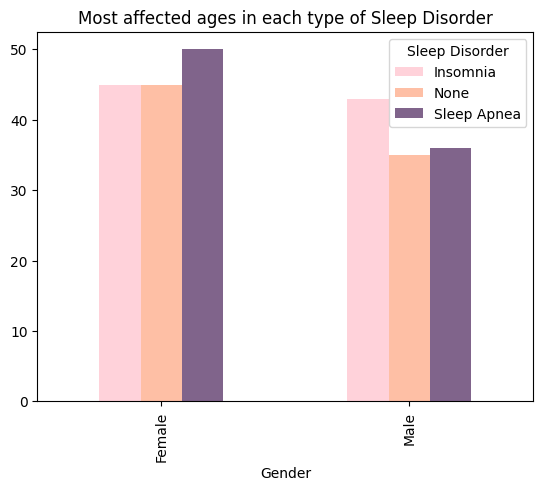

In [23]:
# show most affected ages in each type of sleep disorder (median)
sleep_data.pivot_table(index='Gender',columns='Sleep Disorder',values='Age',aggfunc='median').plot(kind='bar',color={'#FEA47F','#4A235A','pink'},
                                                                                                   title='Most affected ages in each type of Sleep Disorder',
                                                                                                   label='Age',
                                                                                                   alpha=.7)


plt.show()

In [24]:
# Empirical Cumulative Distribution Function plot
fig=px.ecdf(sleep_data,x='Age',
            color='Sleep Disorder',
            color_discrete_sequence=['#f8a5c2','#4A235A','#C39BD3'])


fig.update_layout(title='<b>The effect of ages on sleep </b>..',
                 title_font={'size':25},
                 paper_bgcolor='#EBDEF0',
                 plot_bgcolor='#EBDEF0')


# hide grid lines
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [25]:
import plotly.graph_objects as go


colors = ['palevioletred', '#4A235A', '#C39BD3']
disorder_colors = {disorder: colors[i] for i, disorder in enumerate(sleep_data['Sleep Disorder'].unique())}

fig = go.Figure()

for disorder in sleep_data['Sleep Disorder'].unique():
    subset = sleep_data[sleep_data['Sleep Disorder'] == disorder]
    fig.add_trace(go.Box(y=subset['Sleep Duration'], name=disorder, marker_color=disorder_colors[disorder]))

fig.update_layout(
    title='<b>The Relationship Between Sleep Duration and Sleep Disorder</b>',
    title_font={'size': 24},
    showlegend=True,
    paper_bgcolor='#EBDEF0',
    plot_bgcolor='#EBDEF0'
)

fig.show()

In [26]:
# show scatter plot of BMI category, blood pressure, heart rate and sleep disorder
fig=px.scatter_3d(sleep_data,x='BMI Category',y='Blood Pressure',z='Heart Rate',
                  color='Sleep Disorder',
                  width=1000,
                  height=600,
                  color_discrete_sequence=['#78e08f','#ff7979','#686de0'])


fig.update_layout(title='<b>The relationship between (BMI Category , Blood Pressure and Heart Rate) and their effect on  Sleep Disorder</b> ..',
                  titlefont={'size': 21},
                  width=1280,
                  height=900,
                  showlegend=True)


fig.show()

In [27]:
# show number of each sleep disorder in each stress level
sleep_data.pivot_table(index='Stress Level',
                       columns='Sleep Disorder',
                       aggfunc={'Sleep Disorder':'count'}).style.background_gradient(cmap='BuPu')

In [28]:
# show number of each sleep disorder in each stress level
fig=px.histogram(sleep_data,x='Sleep Disorder',
                 color='Sleep Disorder',
                 facet_col='Stress Level',
                 barmode='relative',
                 color_discrete_sequence=['pink','#4A235A','#C39BD3'],
                 opacity=.8)


fig.update_layout(title='<b>The effect of Stress Level on Sleep Disorder</b> ..',
                  title_font={'size':24},
                  paper_bgcolor='#EBDEF0',
                  plot_bgcolor='#EBDEF0')


fig.update_yaxes(showgrid=False)

fig.show()

In [29]:
BMI_Category = sleep_data['BMI Category'].unique()

print('The values of BMI Category column are :',BMI_Category)

The values of BMI Category column are : ['Overweight' 'Normal' 'Obese' 'Normal Weight']


In [30]:
# show number of each sleep disorder in each BMI category
sleep_data.pivot_table(index='BMI Category',
                       columns='Sleep Disorder',
                       aggfunc={'Sleep Disorder':'count'}).style.background_gradient(cmap='BuPu')

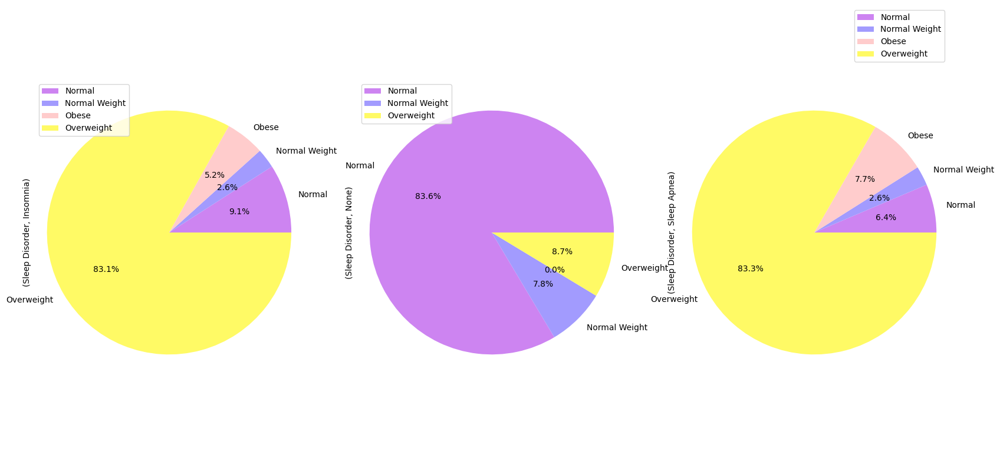

In [31]:
# show number of each sleep disorder in each BMI category in pie plot
sleep_data.pivot_table(index='BMI Category',columns='Sleep Disorder',aggfunc={'Sleep Disorder':'count'}).plot.pie(autopct ='%1.1f%%',
                                                                                                                  subplots=True,
                                                                                                                  figsize=(20,10),
                                                                                                                  colors=['#cd84f1','#a29bfe','#ffcccc','#fffa65'])

plt.axis('equal')

plt.show()

#<b>Data preprocessing<b>


In [57]:
# show number of Nan values in each column
sleep_data.isna().sum()

Person ID                    0
Gender                       0
Age                          0
Occupation                   0
Sleep Duration               0
Quality of Sleep             0
Physical Activity Level      0
Stress Level                 0
BMI Category                 0
Blood Pressure               0
Heart Rate                   0
Daily Steps                  0
Sleep Disorder             219
dtype: int64

<Axes: >

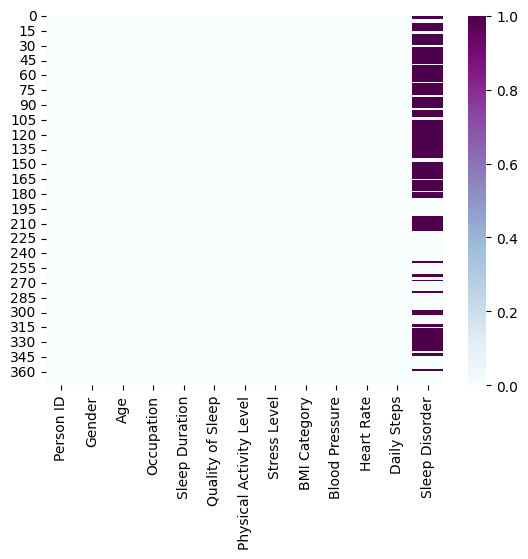

In [58]:
sns.heatmap(sleep_data.isna(),cmap='BuPu')

**Check existing outliers in data**

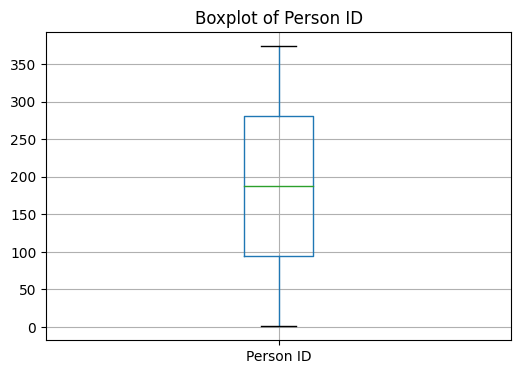

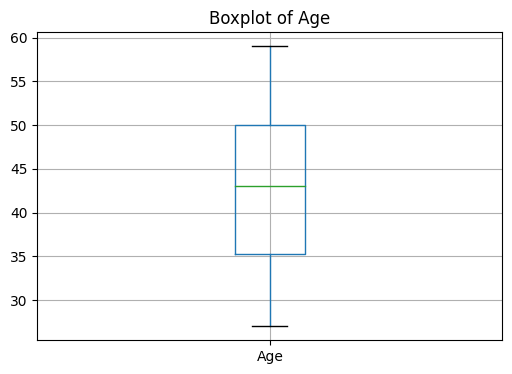

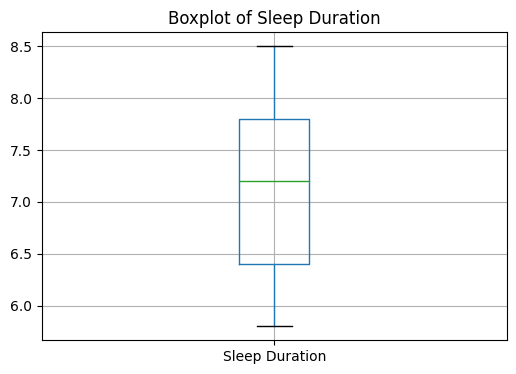

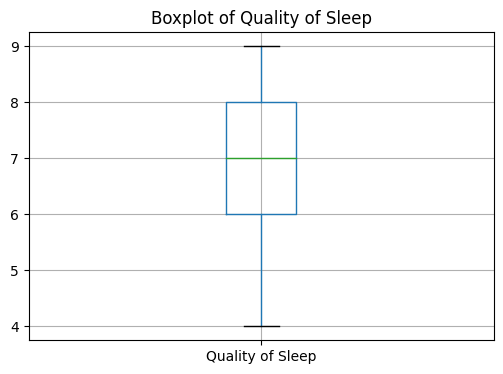

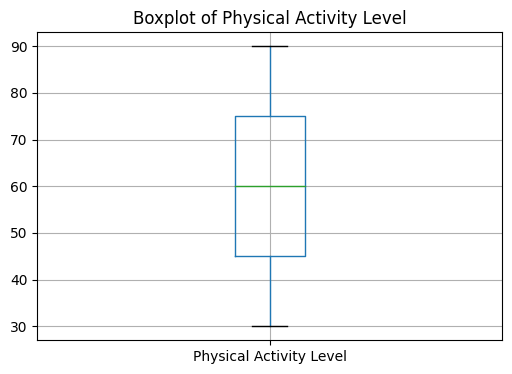

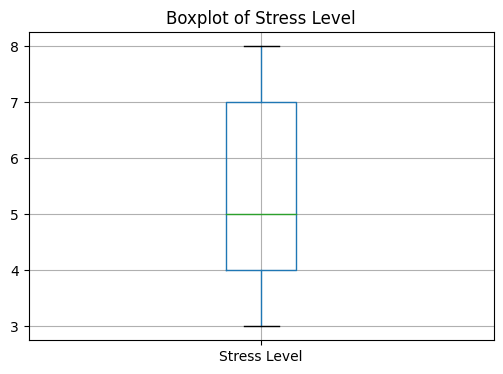

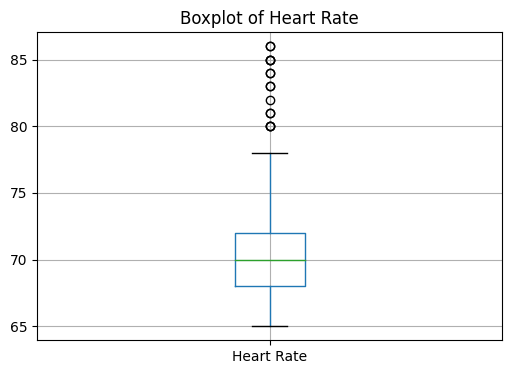

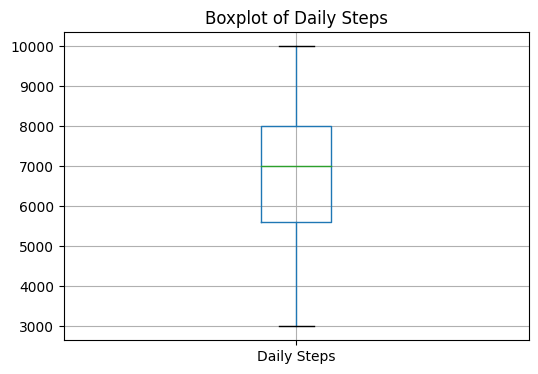

In [37]:
# Create individual boxplots for each numeric column
for column in sleep_data.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))  # Adjust the figsize as per your preference
    sleep_data.boxplot(column=column)
    plt.title(f'Boxplot of {column}')
    plt.show()

In [38]:
# Remove outliers
numeric_data = sleep_data.select_dtypes(include='number')

q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1

outliers = numeric_data[((numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))).any(axis=1)]
cleaned_data = sleep_data[~sleep_data.index.isin(outliers.index)]
cleaned_data.head()

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,27,Software Engineer,6.1,6,42,6,Overweight,126/83,77,4200,None
1,2,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,None
2,3,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,None
7,8,Male,29,Doctor,7.8,7,75,6,Normal,120/80,70,8000,None
8,9,Male,29,Doctor,7.8,7,75,6,Normal,120/80,70,8000,None


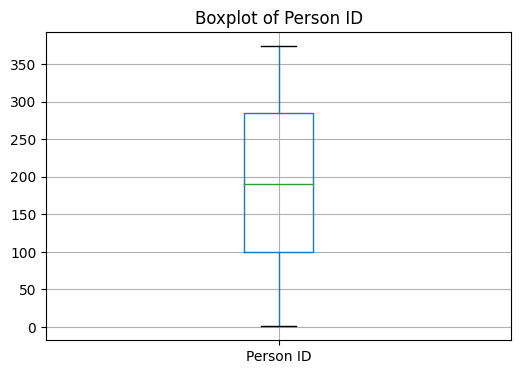

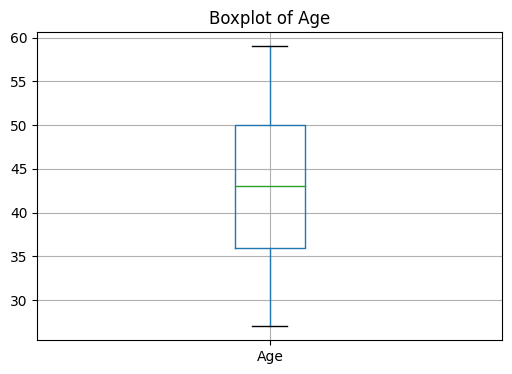

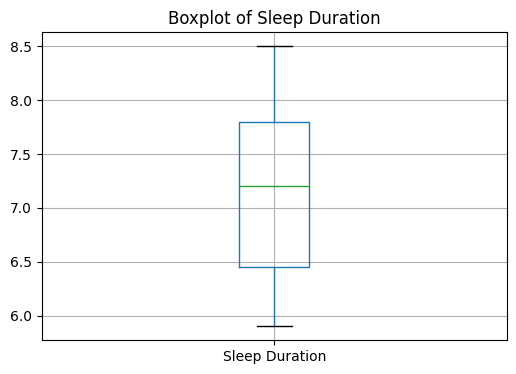

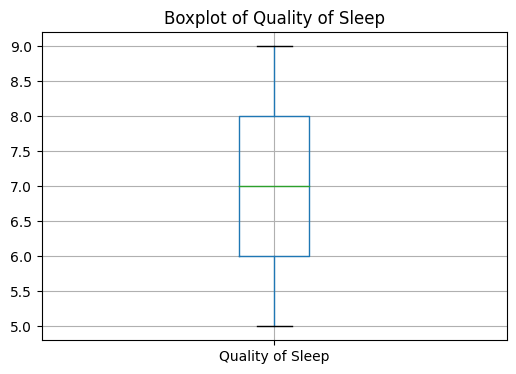

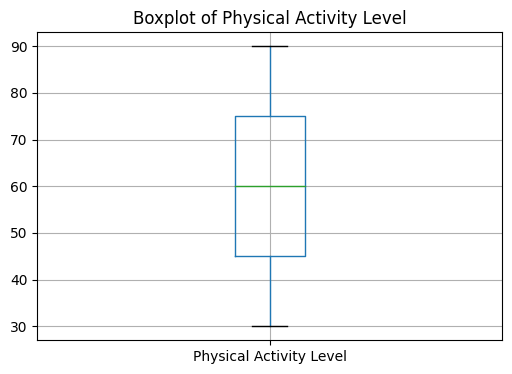

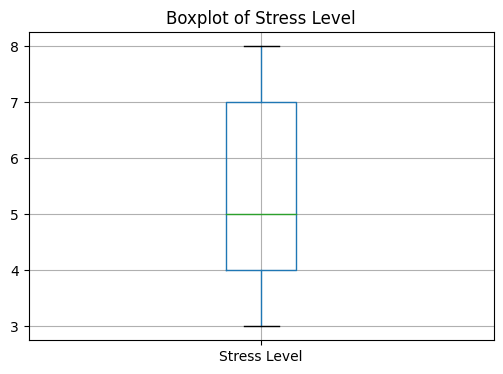

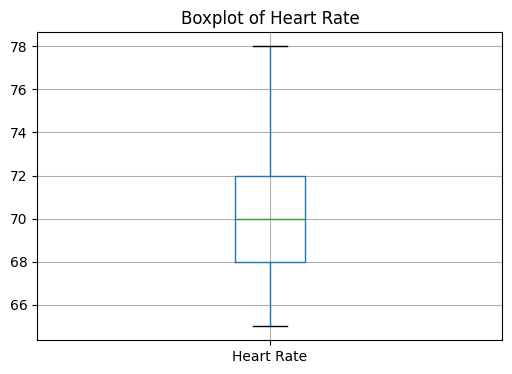

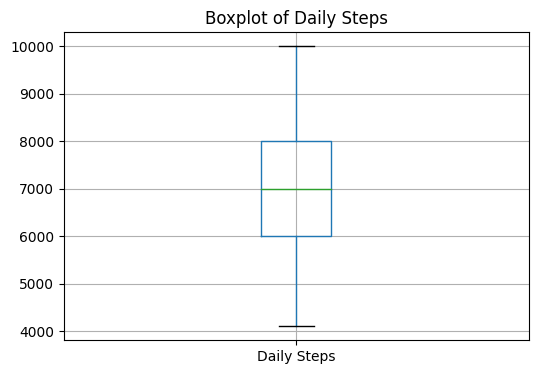

In [39]:
for column in cleaned_data.select_dtypes(include='number').columns:
    plt.figure(figsize=(6, 4))
    cleaned_data.boxplot(column=column)
    plt.title(f'Boxplot of {column}')
    plt.show()

In [40]:
cleaned_data.columns

Index(['Person ID', 'Gender', 'Age', 'Occupation', 'Sleep Duration',
       'Quality of Sleep', 'Physical Activity Level', 'Stress Level',
       'BMI Category', 'Blood Pressure', 'Heart Rate', 'Daily Steps',
       'Sleep Disorder'],
      dtype='object')

In [41]:
# show unique values of 'Blood Pressure' column
cleaned_data['Blood Pressure'].unique()

array(['126/83', '125/80', '120/80', '130/86', '117/76', '118/76',
       '128/85', '128/84', '115/75', '129/84', '130/85', '115/78',
       '119/77', '121/79', '125/82', '135/90', '122/80', '140/95',
       '118/75'], dtype=object)

🔘 Ideal blood pressure systolic (upper number) : less than 120 , diastolic (bottom number) : less than 80

🔘 Normal systolic (upper number) : in range (120 - 129) , diastolic (bottom number) : in range (80 - 84)

🔘 Otherwise, blood pressure is high

In [42]:
cleaned_data['Blood Pressure'] = cleaned_data['Blood Pressure'].apply(lambda x:0 if x in ['120/80','126/83','125/80','128/84','129/84','117/76','118/76','115/75','125/82','122/80'] else 1)
# 0 = normal blood pressure
# 1 = abnormal blood pressure

In [43]:
# Binning (dividing continuous variable into discrete intervals or categories)
cleaned_data["Age"] = pd.cut(cleaned_data["Age"],2)
cleaned_data["Heart Rate"] = pd.cut(cleaned_data["Heart Rate"],4)
cleaned_data["Daily Steps"] = pd.cut(cleaned_data["Daily Steps"],4)
cleaned_data["Sleep Duration"] = pd.cut(cleaned_data["Sleep Duration"],3)
cleaned_data["Physical Activity Level"] = pd.cut(cleaned_data["Physical Activity Level"],4)

In [44]:
# convert categorical data into numerical format
LE = LabelEncoder()

categories=['Gender','Age','Occupation','Sleep Duration','Physical Activity Level','BMI Category','Heart Rate','Daily Steps','Sleep Disorder']
for label in categories:
    cleaned_data[label]=LE.fit_transform(cleaned_data[label])

In [47]:
cleaned_data['Sleep Disorder'].value_counts()

Sleep Disorder
1    219
0     71
2     69
Name: count, dtype: int64

In [48]:
# remove Person ID
cleaned_data.drop(['Person ID'], axis=1, inplace=True)

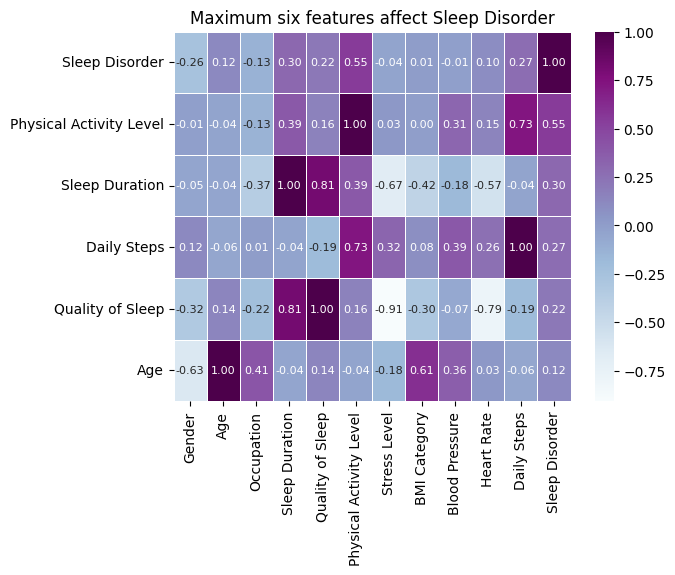

In [49]:
# correlation matrix
correlation = cleaned_data.corr()
max_6_corr = correlation.nlargest(6,"Sleep Disorder")
sns.heatmap(max_6_corr,annot=True,fmt=".2F",annot_kws={"size":8},linewidths=0.5,cmap='BuPu')
plt.title('Maximum six features affect Sleep Disorder')
plt.show()

#<b>Data Spliting<b>

In [50]:
x = cleaned_data.iloc[:,:-1]
y = cleaned_data.iloc[:,-1]

x_shape = x.shape
y_shape = y.shape
print('The dimensions of x is : ',x_shape)
print('The dimensions of y is : ',y_shape)

The dimensions of x is :  (359, 11)
The dimensions of y is :  (359,)


In [51]:
CV = KFold(n_splits=10, random_state=42, shuffle=True)
#CV = KFold(n_splits=10, shuffle=True)

In [52]:
cnt = 1
# split() method generate indices to split data into training and test set.
for train_index, test_index in CV.split(x, y):
    print(f'Fold:{cnt}, Train set: {len(train_index)}, Test set:{len(test_index)}')
    cnt += 1

Fold:1, Train set: 323, Test set:36
Fold:2, Train set: 323, Test set:36
Fold:3, Train set: 323, Test set:36
Fold:4, Train set: 323, Test set:36
Fold:5, Train set: 323, Test set:36
Fold:6, Train set: 323, Test set:36
Fold:7, Train set: 323, Test set:36
Fold:8, Train set: 323, Test set:36
Fold:9, Train set: 323, Test set:36
Fold:10, Train set: 324, Test set:35


#<b>Data modeling<b>


### Grid Search function


In [ ]:
def GrdSrch_Tune(model, X, y, params):
    clf = GridSearchCV(model, params, scoring ='accuracy', cv = CV, n_jobs=-1)
    clf.fit(X, y)

    print("best score is :" , clf.best_score_)
    print("best estimator is :" , clf.best_estimator_)
    print("best Params is :" , clf.best_params_)

    return (clf.best_score_)

# `------------------------------Decision Tree------------------------------`

In [ ]:
#Definition of decision tree model
DT = DecisionTreeClassifier(random_state=0)

# Prepare lists to store accuracies and train/test sets
accuracies_train_DT = []
accuracies_test_DT = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_DT = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_DT = None
yTrain_DT = None
yTest_DT = None
yTestPred_DT = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_DT, x_test_DT = x.iloc[train_index], x.iloc[test_index]
    y_train_DT, y_test_DT = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    DT.fit(x_train_DT, y_train_DT)

    # Predict the labels for the test set of the current fold
    y_test_pred_DT = DT.predict(x_test_DT)

    # Predict the labels for the training set of the current fold
    y_train_pred_DT = DT.predict(x_train_DT)

    # Calculate the accuracy for the training and testing sets
    train_acc_DT = accuracy_score(y_train_DT, y_train_pred_DT)
    test_acc_DT = accuracy_score(y_test_DT, y_test_pred_DT)


    # Store the accuracies for later analysis
    accuracies_train_DT.append(train_acc_DT)
    accuracies_test_DT.append(test_acc_DT)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_DT}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_DT}')
    diff_accuracy = abs(train_acc_DT - test_acc_DT)

    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_DT > test_acc_DT and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_DT = x_train_DT
        yTrain_DT = y_train_DT
        yTest_DT = y_test_DT
        yTestPred_DT = y_test_pred_DT


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9255952380952381
Fold 1 - Test set Accuracy: 0.9473684210526315


Fold 2 - Train set Accuracy: 0.9375
Fold 2 - Test set Accuracy: 0.7894736842105263

Overfitting detected in fold 2


Fold 3 - Train set Accuracy: 0.9315476190476191
Fold 3 - Test set Accuracy: 0.9210526315789473


Fold 4 - Train set Accuracy: 0.9345238095238095
Fold 4 - Test set Accuracy: 0.868421052631579

Overfitting detected in fold 4


Fold 5 - Train set Accuracy: 0.9436201780415431
Fold 5 - Test set Accuracy: 0.8108108108108109

Overfitting detected in fold 5


Fold 6 - Train set Accuracy: 0.9228486646884273
Fold 6 - Test set Accuracy: 1.0

Overfitting detected in fold 6


Fold 7 - Train set Accuracy: 0.9258160237388724
Fold 7 - Test set Accuracy: 0.918918918918919


Fold 8 - Train set Accuracy: 0.9258160237388724
Fold 8 - Test set Accuracy: 0.972972972972973


Fold 9 - Train set Accuracy: 0.9376854599406528
Fold 9 - Test set Accuracy: 0.8378378378378378

Overfitting detected in fold 9

In [ ]:
best_fold_DT = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_DT + 1} with a train accuracy of {accuracies_train_DT[best_fold_DT]} and a test accuracy of {accuracies_test_DT[best_fold_DT]}.")

The best fold is Fold 7 with a train accuracy of 0.9258160237388724 and a test accuracy of 0.918918918918919.


In [ ]:
# Using cross-validation to assess the performance of the Decision Tree classifier,
# calculating the average accuracy across all folds and storing it in cv_DT.
cv_results_DT = cross_val_score(DT, x, y, cv=CV, scoring='accuracy')
cv_DT=cv_results_DT.mean()


print(f"The best fold is Fold {best_fold_DT + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_DT[best_fold_DT]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_DT[best_fold_DT]}.")
print("Cross Val Score Mean: ", cv_DT)
print("\n=========================================================================\n")

diff_train_test_DT = abs(accuracies_train_DT[best_fold_DT] - accuracies_test_DT[best_fold_DT])
diff_test_cv_DT = abs(accuracies_test_DT[best_fold_DT] - cv_DT)

print(f"Difference between Train and Test Accuracy: {diff_train_test_DT}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_DT}")

The best fold is Fold 7:
Tain set Accuracy Best Fold: 0.9258160237388724
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.8985775248933144


Difference between Train and Test Accuracy: 0.006897104819953426
Difference between Test and Cross Val Score Mean: 0.02034139402560453


In [ ]:
precision_score_DT = precision_score(yTest_DT, yTestPred_DT, average='macro')
recall_score_DT = recall_score(yTest_DT, yTestPred_DT, average='macro')
f1_score_DT = f1_score(yTest_DT, yTestPred_DT, average='macro')
onf_DT = confusion_matrix(yTest_DT, yTestPred_DT)

print(f"The best fold is Fold {best_fold_DT + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_DT[best_fold_DT]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_DT[best_fold_DT]}.")
print("Cross Val Score Mean: ", cv_DT)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_DT)
print("Recall Score Best Fold: ", recall_score_DT)
print("F1 Score Best Fold: ", f1_score_DT)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_DT, yTestPred_DT))

The best fold is Fold 7:
Tain set Accuracy Best Fold: 0.9258160237388724
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.8985775248933144

************************************************

Precision Score Best Fold:  0.8690476190476191
Recall Score Best Fold:  0.9246031746031745
F1 Score Best Fold:  0.8931995540691192

************************************************

Report:
              precision    recall  f1-score   support

           0       0.75      0.86      0.80         7
           1       0.86      1.00      0.92         6
           2       1.00      0.92      0.96        24

    accuracy                           0.92        37
   macro avg       0.87      0.92      0.89        37
weighted avg       0.93      0.92      0.92        37




### **`Hyperparameter Tunning ===> Grid Search`**

In [ ]:
param_DT = {'criterion':['gini', 'entropy'] ,
            'max_depth':[None,1,2,3,4,5] ,
            'min_samples_split':[2,3,4] ,
            'min_samples_leaf':[1,2,3,4],
            'max_features':['auto', 'sqrt', 'log2']}


GrdSrch_Tune(DecisionTreeClassifier(random_state=0), xTrain_DT, yTrain_DT, param_DT)

best score is : 0.9110516934046344
best estimator is : DecisionTreeClassifier(max_depth=5, max_features='auto', min_samples_split=3,
                       random_state=0)
best Params is : {'criterion': 'gini', 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 3}


0.9110516934046344

### `Final Model - DT with tune models`

In [ ]:
#Definition of decision tree model
DT2 = DecisionTreeClassifier(max_depth=5, max_features='auto', min_samples_split=3,random_state=0)

# Prepare lists to store accuracies and train/test sets
accuracies_train_DT2 = []
accuracies_test_DT2 = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_DT2 = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_DT2 = None
yTrain_DT2 = None
yTest_DT2 = None
yTestPred_DT2 = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_DT2, x_test_DT2 = x.iloc[train_index], x.iloc[test_index]
    y_train_DT2, y_test_DT2 = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    DT2.fit(x_train_DT2, y_train_DT2)

    # Predict the labels for the test set of the current fold
    y_test_pred_DT2 = DT2.predict(x_test_DT2)

    # Predict the labels for the training set of the current fold
    y_train_pred_DT2 = DT2.predict(x_train_DT2)

    # Calculate the accuracy for the training and testing sets
    train_acc_DT2 = accuracy_score(y_train_DT2, y_train_pred_DT2)
    test_acc_DT2 = accuracy_score(y_test_DT2, y_test_pred_DT2)


    # Store the accuracies for later analysis
    accuracies_train_DT2.append(train_acc_DT2)
    accuracies_test_DT2.append(test_acc_DT2)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_DT2}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_DT2}')
    diff_accuracy = abs(train_acc_DT2 - test_acc_DT2)


    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_DT2 > test_acc_DT2 and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_DT = x_train_DT2
        yTrain_DT = y_train_DT2
        yTest_DT2 = y_test_DT2
        yTestPred_DT2 = y_test_pred_DT2


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9196428571428571
Fold 1 - Test set Accuracy: 0.9736842105263158

Overfitting detected in fold 1


Fold 2 - Train set Accuracy: 0.9345238095238095
Fold 2 - Test set Accuracy: 0.8157894736842105

Overfitting detected in fold 2


Fold 3 - Train set Accuracy: 0.9255952380952381
Fold 3 - Test set Accuracy: 0.9210526315789473


Fold 4 - Train set Accuracy: 0.9285714285714286
Fold 4 - Test set Accuracy: 0.868421052631579

Overfitting detected in fold 4


Fold 5 - Train set Accuracy: 0.9376854599406528
Fold 5 - Test set Accuracy: 0.8108108108108109

Overfitting detected in fold 5


Fold 6 - Train set Accuracy: 0.9198813056379822
Fold 6 - Test set Accuracy: 0.972972972972973

Overfitting detected in fold 6


Fold 7 - Train set Accuracy: 0.9258160237388724
Fold 7 - Test set Accuracy: 0.9459459459459459


Fold 8 - Train set Accuracy: 0.9169139465875371
Fold 8 - Test set Accuracy: 0.9459459459459459


Fold 9 - Train set Accuracy: 0.9287833827893175
Fold 9 - Test set 

In [ ]:
best_fold_DT2 = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_DT2 + 1} with a train accuracy of {accuracies_train_DT2[best_fold_DT2]} and a test accuracy of {accuracies_test_DT2[best_fold_DT2]}.")

The best fold is Fold 3 with a train accuracy of 0.9255952380952381 and a test accuracy of 0.9210526315789473.


In [ ]:
# Using cross-validation to assess the performance of the Decision Tree classifier,
# calculating the average accuracy across all folds and storing it in cv_DT2.
cv_results_DT2 = cross_val_score(DT2, x, y, cv=CV, scoring='accuracy')
cv_DT2=cv_results_DT2.mean()


print(f"The best fold is Fold {best_fold_DT2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_DT2[best_fold_DT2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_DT2[best_fold_DT2]}.")
print("Cross Val Score Mean: ", cv_DT2)
print("\n=========================================================================\n")

diff_train_test_DT2 = abs(accuracies_train_DT2[best_fold_DT2] - accuracies_test_DT2[best_fold_DT2])
diff_test_cv_DT2 = abs(accuracies_test_DT2[best_fold_DT2] - cv_DT2)

print(f"Difference between Train and Test Accuracy: {diff_train_test_DT2}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_DT2}")

The best fold is Fold 3:
Tain set Accuracy Best Fold: 0.9255952380952381
Test set Accuracy Best Fold: 0.9210526315789473.
Cross Val Score Mean:  0.9038406827880513


Difference between Train and Test Accuracy: 0.0045426065162907925
Difference between Test and Cross Val Score Mean: 0.017211948790896048


In [ ]:
precision_score_DT2 = precision_score(yTest_DT2, yTestPred_DT2, average='macro')
recall_score_DT2 = recall_score(yTest_DT2, yTestPred_DT2, average='macro')
f1_score_DT2 = f1_score(yTest_DT2, yTestPred_DT2, average='macro')
onf_DT2 = confusion_matrix(yTest_DT2, yTestPred_DT2)

print(f"The best fold is Fold {best_fold_DT2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_DT2[best_fold_DT2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_DT2[best_fold_DT2]}.")
print("Cross Val Score Mean: ", cv_DT2)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_DT2)
print("Recall Score Best Fold: ", recall_score_DT2)
print("F1 Score Best Fold: ", f1_score_DT2)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_DT2, yTestPred_DT2))

The best fold is Fold 3:
Tain set Accuracy Best Fold: 0.9255952380952381
Test set Accuracy Best Fold: 0.9210526315789473.
Cross Val Score Mean:  0.9038406827880513

************************************************

Precision Score Best Fold:  0.9220779220779222
Recall Score Best Fold:  0.8917748917748917
F1 Score Best Fold:  0.9031746031746032

************************************************

Report:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86         7
           1       1.00      0.82      0.90        11
           2       0.91      1.00      0.95        20

    accuracy                           0.92        38
   macro avg       0.92      0.89      0.90        38
weighted avg       0.93      0.92      0.92        38




In [ ]:
# Performance evaluation of two models before tuning and after tuning

models = [('DT', best_fold_DT + 1, accuracies_train_DT[best_fold_DT], accuracies_test_DT[best_fold_DT], cv_DT, diff_train_test_DT, precision_score_DT, recall_score_DT, f1_score_DT, ''),
          ('DT2', best_fold_DT2 + 1, accuracies_train_DT2[best_fold_DT2], accuracies_test_DT2[best_fold_DT2], cv_DT2, diff_train_test_DT2, precision_score_DT2, recall_score_DT2, f1_score_DT2, ''),
         ]

predict_IR_dt = pd.DataFrame(data = models, columns=['Model', 'Best fold', 'Train_accuracy', 'Test_accuracy', 'Cross Val Score', 'Difference Train & Test', 'precision_score', 'recall_score', 'f1_score', 'Description'])

styles = [
    {'selector': 'th', 'props': [('background-color', '#D3D3D3'), ('color', 'black'), ('border', '1px solid black')]},
    {'selector': 'td', 'props': [('border', '1px solid black')]},
    {'selector': 'th.col_heading', 'props': [('color', 'blue')]}
]

styled_df = predict_IR_dt.style.set_table_styles(styles).background_gradient(cmap='YlGn')

print("\n")
styled_df


,Model,Best fold,Train_accuracy,Test_accuracy,Cross Val Score,Difference Train & Test,precision_score,recall_score,f1_score,Description
0,DT,7,0.925816,0.918919,0.898578,0.006897,0.869048,0.924603,0.893200,
1,DT2,3,0.925595,0.921053,0.903841,0.004543,0.922078,0.891775,0.903175,


# `------------------------------Random Forest------------------------------`

In [ ]:
#Definition of Random Forest model
RF = RandomForestClassifier(random_state=0)

# Prepare lists to store accuracies and train/test sets
accuracies_train_RF = []
accuracies_test_RF = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_RF = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_RF = None
yTrain_RF = None
yTest_RF = None
yTestPred_RF = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_RF, x_test_RF = x.iloc[train_index], x.iloc[test_index]
    y_train_RF, y_test_RF = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    RF.fit(x_train_RF, y_train_RF)

    # Predict the labels for the test set of the current fold
    y_test_pred_RF = RF.predict(x_test_RF)

    # Predict the labels for the training set of the current fold
    y_train_pred_RF = RF.predict(x_train_RF)

    # Calculate the accuracy for the training and testing sets
    train_acc_RF = accuracy_score(y_train_RF, y_train_pred_RF)
    test_acc_RF = accuracy_score(y_test_RF, y_test_pred_RF)


    # Store the accuracies for later analysis
    accuracies_train_RF.append(train_acc_RF)
    accuracies_test_RF.append(test_acc_RF)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_RF}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_RF}')
    diff_accuracy = abs(train_acc_RF - test_acc_RF)

    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_RF > test_acc_RF and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_RF = x_train_RF
        yTrain_RF = y_train_RF
        yTest_RF = y_test_RF
        yTestPred_RF = y_test_pred_RF


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9255952380952381
Fold 1 - Test set Accuracy: 0.9736842105263158


Fold 2 - Train set Accuracy: 0.9375
Fold 2 - Test set Accuracy: 0.7894736842105263

Overfitting detected in fold 2


Fold 3 - Train set Accuracy: 0.9315476190476191
Fold 3 - Test set Accuracy: 0.9210526315789473


Fold 4 - Train set Accuracy: 0.9345238095238095
Fold 4 - Test set Accuracy: 0.8947368421052632


Fold 5 - Train set Accuracy: 0.9436201780415431
Fold 5 - Test set Accuracy: 0.8108108108108109

Overfitting detected in fold 5


Fold 6 - Train set Accuracy: 0.9228486646884273
Fold 6 - Test set Accuracy: 1.0

Overfitting detected in fold 6


Fold 7 - Train set Accuracy: 0.9258160237388724
Fold 7 - Test set Accuracy: 0.972972972972973


Fold 8 - Train set Accuracy: 0.9258160237388724
Fold 8 - Test set Accuracy: 0.972972972972973


Fold 9 - Train set Accuracy: 0.9376854599406528
Fold 9 - Test set Accuracy: 0.8648648648648649

Overfitting detected in fold 9


Fold 10 - Train set Accuracy

In [ ]:
best_fold_RF = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_RF + 1} with a train accuracy of {accuracies_train_RF[best_fold_RF]} and a test accuracy of {accuracies_test_RF[best_fold_RF]}.")

The best fold is Fold 3 with a train accuracy of 0.9315476190476191 and a test accuracy of 0.9210526315789473.


In [ ]:
# Using cross-validation to assess the performance of the Random Forest,
# calculating the average accuracy across all folds and storing it in cv_RF.
cv_results_RF = cross_val_score(RF, x, y, cv=CV, scoring='accuracy')
cv_RF=cv_results_RF.mean()


print(f"The best fold is Fold {best_fold_RF + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_RF[best_fold_RF]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_RF[best_fold_RF]}.")
print("Cross Val Score Mean: ", cv_DT)
print("\n=========================================================================\n")

diff_train_test_RF = abs(accuracies_train_RF[best_fold_RF] - accuracies_test_RF[best_fold_RF])
diff_test_cv_RF = abs(accuracies_test_RF[best_fold_RF] - cv_RF)

print(f"Difference between Train and Test Accuracy: {diff_train_test_RF}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_RF}")

The best fold is Fold 3:
Tain set Accuracy Best Fold: 0.9315476190476191
Test set Accuracy Best Fold: 0.9210526315789473.
Cross Val Score Mean:  0.8985775248933144


Difference between Train and Test Accuracy: 0.010494987468671724
Difference between Test and Cross Val Score Mean: 0.006401137980085347


In [ ]:
precision_score_RF = precision_score(yTest_RF, yTestPred_RF, average='macro')
recall_score_RF = recall_score(yTest_RF, yTestPred_RF, average='macro')
f1_score_RF = f1_score(yTest_RF, yTestPred_RF, average='macro')
onf_RF = confusion_matrix(yTest_RF, yTestPred_RF)

print(f"The best fold is Fold {best_fold_RF + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_RF[best_fold_RF]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_RF[best_fold_RF]}.")
print("Cross Val Score Mean: ", cv_RF)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_RF)
print("Recall Score Best Fold: ", recall_score_RF)
print("F1 Score Best Fold: ", f1_score_RF)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_RF, yTestPred_RF))

The best fold is Fold 3:
Tain set Accuracy Best Fold: 0.9315476190476191
Test set Accuracy Best Fold: 0.9210526315789473.
Cross Val Score Mean:  0.914651493598862

************************************************

Precision Score Best Fold:  0.9220779220779222
Recall Score Best Fold:  0.8917748917748917
F1 Score Best Fold:  0.9031746031746032

************************************************

Report:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86         7
           1       1.00      0.82      0.90        11
           2       0.91      1.00      0.95        20

    accuracy                           0.92        38
   macro avg       0.92      0.89      0.90        38
weighted avg       0.93      0.92      0.92        38




### **`Hyperparameter Tunning ===> Grid Search`**

In [ ]:
param_RF = {'criterion':['gini', 'entropy'] ,
            'max_depth':[ None,3,4,5] ,
            'min_samples_split':[2,3,4,5,6] ,
            'min_samples_leaf':[2,3,4,5,6],
            'n_estimators':[25,50,75,100,200,300]}


GrdSrch_Tune(RandomForestClassifier(random_state=0), xTrain_RF, yTrain_RF, param_RF)

best score is : 0.9169340463458111
best estimator is : RandomForestClassifier(min_samples_leaf=2, n_estimators=25, random_state=0)
best Params is : {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 25}


0.9169340463458111

### `Final Model - RF with tune models`

In [ ]:
#Definition of Random Forest model
RF2 = RandomForestClassifier(min_samples_leaf=2, n_estimators=25, random_state=0)

# Prepare lists to store accuracies and train/test sets
accuracies_train_RF2 = []
accuracies_test_RF2 = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_RF2 = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_RF2 = None
yTrain_RF2 = None
yTest_RF2 = None
yTestPred_RF2 = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_RF2, x_test_RF2 = x.iloc[train_index], x.iloc[test_index]
    y_train_RF2, y_test_RF2 = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    RF2.fit(x_train_RF2, y_train_RF2)

    # Predict the labels for the test set of the current fold
    y_test_pred_RF2 = RF2.predict(x_test_RF2)

    # Predict the labels for the training set of the current fold
    y_train_pred_RF2 = RF2.predict(x_train_RF2)

    # Calculate the accuracy for the training and testing sets
    train_acc_RF2 = accuracy_score(y_train_RF2, y_train_pred_RF2)
    test_acc_RF2 = accuracy_score(y_test_RF2, y_test_pred_RF2)


    # Store the accuracies for later analysis
    accuracies_train_RF2.append(train_acc_RF2)
    accuracies_test_RF2.append(test_acc_RF2)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_RF2}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_RF2}')
    diff_accuracy = abs(train_acc_RF2 - test_acc_RF2)


    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_RF2 > test_acc_RF2 and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_RF2 = x_train_RF2
        yTrain_RF2 = y_train_RF2
        yTest_RF2 = y_test_RF2
        yTestPred_RF2 = y_test_pred_RF2


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9226190476190477
Fold 1 - Test set Accuracy: 0.9736842105263158

Overfitting detected in fold 1


Fold 2 - Train set Accuracy: 0.9345238095238095
Fold 2 - Test set Accuracy: 0.7894736842105263

Overfitting detected in fold 2


Fold 3 - Train set Accuracy: 0.9255952380952381
Fold 3 - Test set Accuracy: 0.9210526315789473


Fold 4 - Train set Accuracy: 0.9255952380952381
Fold 4 - Test set Accuracy: 0.868421052631579

Overfitting detected in fold 4


Fold 5 - Train set Accuracy: 0.9347181008902077
Fold 5 - Test set Accuracy: 0.7837837837837838

Overfitting detected in fold 5


Fold 6 - Train set Accuracy: 0.913946587537092
Fold 6 - Test set Accuracy: 0.9459459459459459


Fold 7 - Train set Accuracy: 0.9228486646884273
Fold 7 - Test set Accuracy: 0.972972972972973

Overfitting detected in fold 7


Fold 8 - Train set Accuracy: 0.9228486646884273
Fold 8 - Test set Accuracy: 0.972972972972973

Overfitting detected in fold 8


Fold 9 - Train set Accuracy: 0.92878

In [ ]:
best_fold_RF2 = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_RF2 + 1} with a train accuracy of {accuracies_train_RF2[best_fold_RF2]} and a test accuracy of {accuracies_test_RF2[best_fold_RF2]}.")

The best fold is Fold 10 with a train accuracy of 0.9228486646884273 and a test accuracy of 0.918918918918919.


In [ ]:
# Using cross-validation to assess the performance of the Random Forest,
# calculating the average accuracy across all folds and storing it in cv_RF2.
cv_results_RF2 = cross_val_score(RF2, x, y, cv=CV, scoring='accuracy')
cv_RF2=cv_results_RF2.mean()


print(f"The best fold is Fold {best_fold_RF2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_RF2[best_fold_RF2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_RF2[best_fold_RF2]}.")
print("Cross Val Score Mean: ", cv_RF2)
print("\n=========================================================================\n")

diff_train_test_RF2 = abs(accuracies_train_RF2[best_fold_RF2] - accuracies_test_RF2[best_fold_RF2])
diff_test_cv_RF2 = abs(accuracies_test_RF2[best_fold_RF2] - cv_RF2)

print(f"Difference between Train and Test Accuracy: {diff_train_test_RF2}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_RF2}")

The best fold is Fold 10:
Tain set Accuracy Best Fold: 0.9228486646884273
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.8985064011379802


Difference between Train and Test Accuracy: 0.00392974576950833
Difference between Test and Cross Val Score Mean: 0.020412517780938777


In [ ]:
precision_score_RF2 = precision_score(yTest_RF2, yTestPred_RF2, average='macro')
recall_score_RF2 = recall_score(yTest_RF2, yTestPred_RF2, average='macro')
f1_score_RF2 = f1_score(yTest_RF2, yTestPred_RF2, average='macro')
onf_RF2 = confusion_matrix(yTest_RF2, yTestPred_RF2)

print(f"The best fold is Fold {best_fold_RF2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_RF2[best_fold_RF2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_RF2[best_fold_RF2]}.")
print("Cross Val Score Mean: ", cv_RF2)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_RF2)
print("Recall Score Best Fold: ", recall_score_RF2)
print("F1 Score Best Fold: ", f1_score_RF2)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_RF2, yTestPred_RF2))

The best fold is Fold 10:
Tain set Accuracy Best Fold: 0.9228486646884273
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.8985064011379802

************************************************

Precision Score Best Fold:  0.8796296296296297
Recall Score Best Fold:  0.9220779220779222
F1 Score Best Fold:  0.8978524743230626

************************************************

Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94         8
           1       0.75      0.86      0.80         7
           2       1.00      0.91      0.95        22

    accuracy                           0.92        37
   macro avg       0.88      0.92      0.90        37
weighted avg       0.93      0.92      0.92        37




In [ ]:
# Performance evaluation of two models before tuning and after tuning

models = [('RF', best_fold_RF + 1, accuracies_train_RF[best_fold_RF], accuracies_test_RF[best_fold_RF], cv_RF, diff_train_test_RF, precision_score_RF, recall_score_RF, f1_score_RF, ''),
          ('RF2', best_fold_RF2 + 1, accuracies_train_RF2[best_fold_RF2], accuracies_test_RF2[best_fold_RF2], cv_RF2, diff_train_test_RF2, precision_score_RF2, recall_score_RF2, f1_score_RF2, ''),
         ]

predict_IR_rf = pd.DataFrame(data = models, columns=['Model', 'Best fold', 'Train_accuracy', 'Test_accuracy', 'Cross Val Score', 'Difference Train & Test', 'precision_score', 'recall_score', 'f1_score', 'Description'])

styles = [
    {'selector': 'th', 'props': [('background-color', '#D3D3D3'), ('color', 'black'), ('border', '1px solid black')]},
    {'selector': 'td', 'props': [('border', '1px solid black')]},
    {'selector': 'th.col_heading', 'props': [('color', 'blue')]}
]

styled_rf = predict_IR_rf.style.set_table_styles(styles).background_gradient(cmap='YlGn')

print("\n")
styled_rf


,Model,Best fold,Train_accuracy,Test_accuracy,Cross Val Score,Difference Train & Test,precision_score,recall_score,f1_score,Description
0,RF,3,0.931548,0.921053,0.914651,0.010495,0.922078,0.891775,0.903175,
1,RF2,10,0.922849,0.918919,0.898506,0.003930,0.879630,0.922078,0.897852,


# `----------------------Gradient Boosting Classifier----------------------`


In [ ]:
#Definition of Gradient Boosting Classifier model
GB = GradientBoostingClassifier()


# Prepare lists to store accuracies and train/test sets
accuracies_train_GB = []
accuracies_test_GB = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_GB = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_GB = None
yTrain_GB = None
yTest_GB = None
yTestPred_GB = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_GB, x_test_GB = x.iloc[train_index], x.iloc[test_index]
    y_train_GB, y_test_GB = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    GB.fit(x_train_GB, y_train_GB)

    # Predict the labels for the test set of the current fold
    y_test_pred_GB = GB.predict(x_test_GB)

    # Predict the labels for the training set of the current fold
    y_train_pred_GB = GB.predict(x_train_GB)

    # Calculate the accuracy for the training and testing sets
    train_acc_GB = accuracy_score(y_train_GB, y_train_pred_GB)
    test_acc_GB = accuracy_score(y_test_GB, y_test_pred_GB)


    # Store the accuracies for later analysis
    accuracies_train_GB.append(train_acc_GB)
    accuracies_test_GB.append(test_acc_GB)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_GB}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_GB}')
    diff_accuracy = abs(train_acc_GB - test_acc_GB)

    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_GB > test_acc_GB and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_GB = x_train_GB
        yTrain_GB = y_train_GB
        yTest_GB = y_test_GB
        yTestPred_GB = y_test_pred_GB


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9315476190476191
Fold 1 - Test set Accuracy: 0.9210526315789473


Fold 2 - Train set Accuracy: 0.9226190476190477
Fold 2 - Test set Accuracy: 1.0

Overfitting detected in fold 2


Fold 3 - Train set Accuracy: 0.9345238095238095
Fold 3 - Test set Accuracy: 0.868421052631579

Overfitting detected in fold 3


Fold 4 - Train set Accuracy: 0.9315476190476191
Fold 4 - Test set Accuracy: 0.9210526315789473


Fold 5 - Train set Accuracy: 0.9287833827893175
Fold 5 - Test set Accuracy: 0.9459459459459459


Fold 6 - Train set Accuracy: 0.9287833827893175
Fold 6 - Test set Accuracy: 0.9459459459459459


Fold 7 - Train set Accuracy: 0.9347181008902077
Fold 7 - Test set Accuracy: 0.8918918918918919


Fold 8 - Train set Accuracy: 0.9317507418397626
Fold 8 - Test set Accuracy: 0.918918918918919


Fold 9 - Train set Accuracy: 0.9376854599406528
Fold 9 - Test set Accuracy: 0.8648648648648649

Overfitting detected in fold 9


Fold 10 - Train set Accuracy: 0.9287833827893175

In [ ]:
best_fold_GB = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_GB + 1} with a train accuracy of {accuracies_train_GB[best_fold_GB]} and a test accuracy of {accuracies_test_GB[best_fold_GB]}.")

The best fold is Fold 1 with a train accuracy of 0.9315476190476191 and a test accuracy of 0.9210526315789473.


In [ ]:
# Using cross-validation to assess the performance of the Gradient Boosting Classifier,
# calculating the average accuracy across all folds and storing it in cv_GB.
cv_results_GB = cross_val_score(GB, x, y, cv=CV, scoring='accuracy')
cv_GB=cv_results_GB.mean()


print(f"The best fold is Fold {best_fold_GB + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_GB[best_fold_GB]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_GB[best_fold_GB]}.")
print("Cross Val Score Mean: ", cv_GB)
print("\n=========================================================================\n")

diff_train_test_GB = abs(accuracies_train_GB[best_fold_GB] - accuracies_test_GB[best_fold_GB])
diff_test_cv_GB = abs(accuracies_test_GB[best_fold_GB] - cv_GB)

print(f"Difference between Train and Test Accuracy: {diff_train_test_GB}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_GB}")

The best fold is Fold 1:
Tain set Accuracy Best Fold: 0.9315476190476191
Test set Accuracy Best Fold: 0.9210526315789473.
Cross Val Score Mean:  0.9089615931721197


Difference between Train and Test Accuracy: 0.010494987468671724
Difference between Test and Cross Val Score Mean: 0.012091038406827681


In [ ]:
precision_score_GB = precision_score(yTest_GB, yTestPred_GB, average='macro')
recall_score_GB = recall_score(yTest_GB, yTestPred_GB, average='macro')
f1_score_GB = f1_score(yTest_GB, yTestPred_GB, average='macro')
onf_GB = confusion_matrix(yTest_GB, yTestPred_GB)

print(f"The best fold is Fold {best_fold_GB + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_GB[best_fold_GB]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_GB[best_fold_GB]}.")
print("Cross Val Score Mean: ", cv_GB)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_GB)
print("Recall Score Best Fold: ", recall_score_GB)
print("F1 Score Best Fold: ", f1_score_GB)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_GB, yTestPred_GB))

The best fold is Fold 1:
Tain set Accuracy Best Fold: 0.9315476190476191
Test set Accuracy Best Fold: 0.9210526315789473.
Cross Val Score Mean:  0.9089615931721197

************************************************

Precision Score Best Fold:  0.9333333333333332
Recall Score Best Fold:  0.9090909090909092
F1 Score Best Fold:  0.9122807017543861

************************************************

Report:
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        11
           1       0.90      1.00      0.95         9
           2       0.90      1.00      0.95        18

    accuracy                           0.92        38
   macro avg       0.93      0.91      0.91        38
weighted avg       0.93      0.92      0.92        38




### **`Hyperparameter Tunning ===> Grid Search`**

In [ ]:
param_GB = {'loss': ['log_loss', 'deviance', 'exponential'],
            'n_estimators': [25, 50, 75, 100, 200, 300],
            'criterion': ['friedman_mse', 'mse', 'mae'],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'subsample': [0.6, 0.8, 1.0],
            'max_depth': [3, 4, 5, 6, 7, 8]}

GrdSrch_Tune(GradientBoostingClassifier(), xTrain_GB, yTrain_GB, param_GB)

best score is : 0.9196078431372549
best estimator is : GradientBoostingClassifier(max_depth=6, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=300,
                           subsample=0.6)
best Params is : {'criterion': 'friedman_mse', 'loss': 'log_loss', 'max_depth': 6, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300, 'subsample': 0.6}


0.9196078431372549

### `Final Model - GB with tune models`

In [ ]:
#Definition of Gradient Boosting Classifier model
GB2 = GradientBoostingClassifier(max_depth=6, min_samples_leaf=4,min_samples_split=10, n_estimators=300,subsample=0.6)

# Prepare lists to store accuracies and train/test sets
accuracies_train_GB2 = []
accuracies_test_GB2 = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_GB2 = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_GB2 = None
yTrain_GB2 = None
yTest_GB2 = None
yTestPred_GB2 = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_GB2, x_test_GB2 = x.iloc[train_index], x.iloc[test_index]
    y_train_GB2, y_test_GB2 = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    GB2.fit(x_train_GB2, y_train_GB2)

    # Predict the labels for the test set of the current fold
    y_test_pred_GB2 = GB2.predict(x_test_GB2)

    # Predict the labels for the training set of the current fold
    y_train_pred_GB2 = GB2.predict(x_train_GB2)

    # Calculate the accuracy for the training and testing sets
    train_acc_GB2 = accuracy_score(y_train_GB2, y_train_pred_GB2)
    test_acc_GB2 = accuracy_score(y_test_GB2, y_test_pred_GB2)


    # Store the accuracies for later analysis
    accuracies_train_GB2.append(train_acc_GB2)
    accuracies_test_GB2.append(test_acc_GB2)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_GB2}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_GB2}')
    diff_accuracy = abs(train_acc_GB2 - test_acc_GB2)


    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_GB2 > test_acc_GB2 and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_GB2 = x_train_GB2
        yTrain_GB2 = y_train_GB2
        yTest_GB2 = y_test_GB2
        yTestPred_GB2 = y_test_pred_GB2


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9315476190476191
Fold 1 - Test set Accuracy: 0.9210526315789473


Fold 2 - Train set Accuracy: 0.9404761904761905
Fold 2 - Test set Accuracy: 0.8421052631578947

Overfitting detected in fold 2


Fold 3 - Train set Accuracy: 0.9315476190476191
Fold 3 - Test set Accuracy: 0.9210526315789473


Fold 4 - Train set Accuracy: 0.9315476190476191
Fold 4 - Test set Accuracy: 0.8157894736842105

Overfitting detected in fold 4


Fold 5 - Train set Accuracy: 0.9317507418397626
Fold 5 - Test set Accuracy: 0.918918918918919


Fold 6 - Train set Accuracy: 0.9347181008902077
Fold 6 - Test set Accuracy: 0.8918918918918919


Fold 7 - Train set Accuracy: 0.9317507418397626
Fold 7 - Test set Accuracy: 0.8648648648648649

Overfitting detected in fold 7


Fold 8 - Train set Accuracy: 0.9287833827893175
Fold 8 - Test set Accuracy: 0.9459459459459459


Fold 9 - Train set Accuracy: 0.9258160237388724
Fold 9 - Test set Accuracy: 0.918918918918919


Fold 10 - Train set Accuracy: 0.9

In [ ]:
best_fold_GB2 = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_GB2 + 1} with a train accuracy of {accuracies_train_GB2[best_fold_GB2]} and a test accuracy of {accuracies_test_GB2[best_fold_GB2]}.")

The best fold is Fold 9 with a train accuracy of 0.9258160237388724 and a test accuracy of 0.918918918918919.


In [ ]:
# Using cross-validation to assess the performance of the Gradient Boosting Classifier,
# calculating the average accuracy across all folds and storing it in cv_GB2.
cv_results_GB2 = cross_val_score(GB2, x, y, cv=CV, scoring='accuracy')
cv_GB2=cv_results_GB2.mean()


print(f"The best fold is Fold {best_fold_GB2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_GB2[best_fold_GB2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_GB2[best_fold_GB2]}.")
print("Cross Val Score Mean: ", cv_GB2)
print("\n=========================================================================\n")

diff_train_test_GB2 = abs(accuracies_train_GB2[best_fold_GB2] - accuracies_test_GB2[best_fold_GB2])
diff_test_cv_GB2 = abs(accuracies_test_GB2[best_fold_GB2] - cv_GB2)

print(f"Difference between Train and Test Accuracy: {diff_train_test_GB2}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_GB2}")

The best fold is Fold 9:
Tain set Accuracy Best Fold: 0.9258160237388724
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.919914651493599


Difference between Train and Test Accuracy: 0.006897104819953426
Difference between Test and Cross Val Score Mean: 0.0009957325746799972


In [ ]:
precision_score_GB2 = precision_score(yTest_GB2, yTestPred_GB2, average='macro')
recall_score_GB2 = recall_score(yTest_GB2, yTestPred_GB2, average='macro')
f1_score_GB2 = f1_score(yTest_GB2, yTestPred_GB2, average='macro')
onf_GB2 = confusion_matrix(yTest_GB2, yTestPred_GB2)

print(f"The best fold is Fold {best_fold_GB2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_GB2[best_fold_GB2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_GB2[best_fold_GB2]}.")
print("Cross Val Score Mean: ", cv_GB2)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_GB2)
print("Recall Score Best Fold: ", recall_score_GB2)
print("F1 Score Best Fold: ", f1_score_GB2)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_GB2, yTestPred_GB2))

The best fold is Fold 9:
Tain set Accuracy Best Fold: 0.9258160237388724
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.919914651493599

************************************************

Precision Score Best Fold:  0.8994708994708995
Recall Score Best Fold:  0.8994708994708995
F1 Score Best Fold:  0.8994708994708995

************************************************

Report:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86         7
           1       0.89      0.89      0.89         9
           2       0.95      0.95      0.95        21

    accuracy                           0.92        37
   macro avg       0.90      0.90      0.90        37
weighted avg       0.92      0.92      0.92        37




In [ ]:
# Performance evaluation of two models before tuning and after tuning

models = [('GB', best_fold_GB + 1, accuracies_train_GB[best_fold_GB], accuracies_test_GB[best_fold_GB], cv_GB, diff_train_test_GB, precision_score_GB, recall_score_GB, f1_score_GB, ''),
          ('GB2', best_fold_GB2 + 1, accuracies_train_GB2[best_fold_GB2], accuracies_test_GB2[best_fold_GB2], cv_GB2, diff_train_test_GB2, precision_score_GB2, recall_score_GB2, f1_score_GB2, ''),
         ]

predict_IR_gb = pd.DataFrame(data = models, columns=['Model', 'Best fold', 'Train_accuracy', 'Test_accuracy', 'Cross Val Score', 'Difference Train & Test', 'precision_score', 'recall_score', 'f1_score', 'Description'])

styles = [
    {'selector': 'th', 'props': [('background-color', '#D3D3D3'), ('color', 'black'), ('border', '1px solid black')]},
    {'selector': 'td', 'props': [('border', '1px solid black')]},
    {'selector': 'th.col_heading', 'props': [('color', 'blue')]}
]

styled_gb = predict_IR_gb.style.set_table_styles(styles).background_gradient(cmap='YlGn')

print("\n")
styled_gb


,Model,Best fold,Train_accuracy,Test_accuracy,Cross Val Score,Difference Train & Test,precision_score,recall_score,f1_score,Description
0,GB,1,0.931548,0.921053,0.908962,0.010495,0.933333,0.909091,0.912281,
1,GB2,9,0.925816,0.918919,0.919915,0.006897,0.899471,0.899471,0.899471,


# `-------------------------------Extra Tree-------------------------------`

In [ ]:
#Definition of Extra Tree model
ET = ExtraTreesClassifier()


# Prepare lists to store accuracies and train/test sets
accuracies_train_ET = []
accuracies_test_ET = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_ET = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_ET = None
yTrain_ET = None
yTest_ET = None
yTestPred_ET = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_ET, x_test_ET = x.iloc[train_index], x.iloc[test_index]
    y_train_ET, y_test_ET = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    ET.fit(x_train_ET, y_train_ET)

    # Predict the labels for the test set of the current fold
    y_test_pred_ET = ET.predict(x_test_ET)

    # Predict the labels for the training set of the current fold
    y_train_pred_ET = ET.predict(x_train_ET)

    # Calculate the accuracy for the training and testing sets
    train_acc_ET = accuracy_score(y_train_ET, y_train_pred_ET)
    test_acc_ET = accuracy_score(y_test_ET, y_test_pred_ET)


    # Store the accuracies for later analysis
    accuracies_train_ET.append(train_acc_ET)
    accuracies_test_ET.append(test_acc_ET)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_ET}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_ET}')
    diff_accuracy = abs(train_acc_ET - test_acc_ET)

    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_ET > test_acc_ET and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_ET = x_train_ET
        yTrain_ET = y_train_ET
        yTest_ET = y_test_ET
        yTestPred_ET = y_test_pred_ET


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9315476190476191
Fold 1 - Test set Accuracy: 0.9210526315789473


Fold 2 - Train set Accuracy: 0.9285714285714286
Fold 2 - Test set Accuracy: 0.8947368421052632


Fold 3 - Train set Accuracy: 0.9345238095238095
Fold 3 - Test set Accuracy: 0.8947368421052632


Fold 4 - Train set Accuracy: 0.9285714285714286
Fold 4 - Test set Accuracy: 0.8947368421052632


Fold 5 - Train set Accuracy: 0.9258160237388724
Fold 5 - Test set Accuracy: 0.972972972972973


Fold 6 - Train set Accuracy: 0.9287833827893175
Fold 6 - Test set Accuracy: 0.918918918918919


Fold 7 - Train set Accuracy: 0.9258160237388724
Fold 7 - Test set Accuracy: 0.972972972972973


Fold 8 - Train set Accuracy: 0.9317507418397626
Fold 8 - Test set Accuracy: 0.918918918918919


Fold 9 - Train set Accuracy: 0.9406528189910979
Fold 9 - Test set Accuracy: 0.8378378378378378

Overfitting detected in fold 9


Fold 10 - Train set Accuracy: 0.9376854599406528
Fold 10 - Test set Accuracy: 0.8648648648648649

O

In [ ]:
best_fold_ET = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_ET + 1} with a train accuracy of {accuracies_train_ET[best_fold_ET]} and a test accuracy of {accuracies_test_ET[best_fold_ET]}.")

The best fold is Fold 6 with a train accuracy of 0.9287833827893175 and a test accuracy of 0.918918918918919.


In [ ]:
# Using cross-validation to assess the performance of the Extra Tree,
# calculating the average accuracy across all folds and storing it in cv_ET.
cv_results_ET = cross_val_score(ET, x, y, cv=CV, scoring='accuracy')
cv_ET=cv_results_ET.mean()


print(f"The best fold is Fold {best_fold_ET + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_ET[best_fold_ET]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_ET[best_fold_ET]}.")
print("Cross Val Score Mean: ", cv_ET)
print("\n=========================================================================\n")

diff_train_test_ET = abs(accuracies_train_ET[best_fold_ET] - accuracies_test_ET[best_fold_ET])
diff_test_cv_ET = abs(accuracies_test_ET[best_fold_ET] - cv_ET)

print(f"Difference between Train and Test Accuracy: {diff_train_test_ET}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_ET}")

The best fold is Fold 6:
Tain set Accuracy Best Fold: 0.9287833827893175
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.9089615931721194


Difference between Train and Test Accuracy: 0.009864463870398521
Difference between Test and Cross Val Score Mean: 0.009957325746799528


In [ ]:
precision_score_ET = precision_score(yTest_ET, yTestPred_ET, average='macro')
recall_score_ET = recall_score(yTest_ET, yTestPred_ET, average='macro')
f1_score_ET = f1_score(yTest_ET, yTestPred_ET, average='macro')
onf_ET = confusion_matrix(yTest_ET, yTestPred_ET)

print(f"The best fold is Fold {best_fold_ET + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_ET[best_fold_ET]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_ET[best_fold_ET]}.")
print("Cross Val Score Mean: ", cv_ET)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_ET)
print("Recall Score Best Fold: ", recall_score_ET)
print("F1 Score Best Fold: ", f1_score_ET)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_ET, yTestPred_ET))

The best fold is Fold 6:
Tain set Accuracy Best Fold: 0.9287833827893175
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.9089615931721194

************************************************

Precision Score Best Fold:  0.875
Recall Score Best Fold:  0.8955627705627706
F1 Score Best Fold:  0.8839147286821705

************************************************

Report:
              precision    recall  f1-score   support

           0       0.75      0.86      0.80         7
           1       0.88      0.88      0.88         8
           2       1.00      0.95      0.98        22

    accuracy                           0.92        37
   macro avg       0.88      0.90      0.88        37
weighted avg       0.93      0.92      0.92        37




### **`Hyperparameter Tunning ===> Grid Search`**

In [ ]:
param_ET = {'criterion':['gini', 'entropy' , 'log_loss'] ,
            'max_depth':[3, 5, 10, 20, 30] ,
            'min_samples_split':[2, 4, 5, 6, 20] ,
            'min_samples_leaf':[1, 2, 4, 8, 16, 32],
            'n_estimators':[25, 50, 75, 100],
            'max_features' : ['auto', 'sqrt', 'log2']}


GrdSrch_Tune(ExtraTreesClassifier(), xTrain_ET, yTrain_ET, param_ET)

best score is : 0.9198752228163991
best estimator is : ExtraTreesClassifier(max_depth=5, max_features='log2', n_estimators=50)
best Params is : {'criterion': 'gini', 'max_depth': 5, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}


0.9198752228163991

### `Final Model - ET with tune models`

In [ ]:
#Definition of Gradient Extra Tree model
ET2 = ExtraTreesClassifier(max_depth=5, max_features='log2', n_estimators=50)

# Prepare lists to store accuracies and train/test sets
accuracies_train_ET2 = []
accuracies_test_ET2 = []


# Threshold for detecting overfitting
threshold = 0.05

# Initialize overfitting flag and counter
overfit_detected = False
cnt =1

# Initialize variables to store the best fold information
best_fold_index = None
best_fold_GB2 = None
min_diff_accuracy = float('inf')

# Initialize variables to store the training data of the best fold
xTrain_ET2 = None
yTrain_ET2 = None
yTest_ET2 = None
yTestPred_ET2 = None

In [ ]:
for train_index, test_index in CV.split(x, y):

    # Split the data into training and testing sets for the current fold
    x_train_ET2, x_test_ET2 = x.iloc[train_index], x.iloc[test_index]
    y_train_ET2, y_test_ET2 = y.iloc[train_index], y.iloc[test_index]

    # Train the model on the training set of the current fold
    ET2.fit(x_train_ET2, y_train_ET2)

    # Predict the labels for the test set of the current fold
    y_test_pred_ET2 = ET2.predict(x_test_ET2)

    # Predict the labels for the training set of the current fold
    y_train_pred_ET2 = ET2.predict(x_train_ET2)

    # Calculate the accuracy for the training and testing sets
    train_acc_ET2 = accuracy_score(y_train_ET2, y_train_pred_ET2)
    test_acc_ET2 = accuracy_score(y_test_ET2, y_test_pred_ET2)


    # Store the accuracies for later analysis
    accuracies_train_ET2.append(train_acc_ET2)
    accuracies_test_ET2.append(test_acc_ET2)


    print(f'Fold {cnt} - Train set Accuracy: {train_acc_ET2}')
    print(f'Fold {cnt} - Test set Accuracy: {test_acc_ET2}')
    diff_accuracy = abs(train_acc_ET2 - test_acc_ET2)


    # Check if this fold has the smallest difference in accuracy and train accuracy > test accuracy
    if train_acc_ET2 > test_acc_ET2 and diff_accuracy < min_diff_accuracy:
        min_diff_accuracy = diff_accuracy
        best_fold_index = cnt - 1  # Store the fold index

        # Store the training and testing data of the best fold
        xTrain_ET2 = x_train_ET2
        yTrain_ET2 = y_train_ET2
        yTest_ET2 = y_test_ET2
        yTestPred_ET2 = y_test_pred_ET2


    # Check for overfitting
    if diff_accuracy > threshold:
        overfit_detected = True
        print("\nOverfitting detected in fold", cnt)

    print("\n=======================================================\n")
    cnt += 1

Fold 1 - Train set Accuracy: 0.9315476190476191
Fold 1 - Test set Accuracy: 0.868421052631579

Overfitting detected in fold 1


Fold 2 - Train set Accuracy: 0.9285714285714286
Fold 2 - Test set Accuracy: 0.9473684210526315


Fold 3 - Train set Accuracy: 0.9315476190476191
Fold 3 - Test set Accuracy: 0.9210526315789473


Fold 4 - Train set Accuracy: 0.9285714285714286
Fold 4 - Test set Accuracy: 0.9473684210526315


Fold 5 - Train set Accuracy: 0.9317507418397626
Fold 5 - Test set Accuracy: 0.8918918918918919


Fold 6 - Train set Accuracy: 0.9287833827893175
Fold 6 - Test set Accuracy: 0.9459459459459459


Fold 7 - Train set Accuracy: 0.9258160237388724
Fold 7 - Test set Accuracy: 0.918918918918919


Fold 8 - Train set Accuracy: 0.9376854599406528
Fold 8 - Test set Accuracy: 0.8648648648648649

Overfitting detected in fold 8


Fold 9 - Train set Accuracy: 0.9317507418397626
Fold 9 - Test set Accuracy: 0.918918918918919


Fold 10 - Train set Accuracy: 0.9317507418397626
Fold 10 - Test se

In [ ]:
best_fold_ET2 = best_fold_index

In [ ]:
# Print the best fold information
print(f"The best fold is Fold {best_fold_ET2 + 1} with a train accuracy of {accuracies_train_ET2[best_fold_ET2]} and a test accuracy of {accuracies_test_ET2[best_fold_ET2]}.")

The best fold is Fold 7 with a train accuracy of 0.9258160237388724 and a test accuracy of 0.918918918918919.


In [ ]:
# Using cross-validation to assess the performance of the Extra Tree,
# calculating the average accuracy across all folds and storing it in cv_ET2.
cv_results_ET2 = cross_val_score(ET2, x, y, cv=CV, scoring='accuracy')
cv_ET2=cv_results_ET2.mean()


print(f"The best fold is Fold {best_fold_ET2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_ET2[best_fold_ET2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_ET2[best_fold_ET2]}.")
print("Cross Val Score Mean: ", cv_ET2)
print("\n=========================================================================\n")

diff_train_test_ET2 = abs(accuracies_train_ET2[best_fold_ET2] - accuracies_test_ET2[best_fold_ET2])
diff_test_cv_ET2 = abs(accuracies_test_ET2[best_fold_ET2] - cv_ET2)

print(f"Difference between Train and Test Accuracy: {diff_train_test_ET2}")
print(f"Difference between Test and Cross Val Score Mean: {diff_test_cv_ET2}")

The best fold is Fold 7:
Tain set Accuracy Best Fold: 0.9258160237388724
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.9116642958748222


Difference between Train and Test Accuracy: 0.006897104819953426
Difference between Test and Cross Val Score Mean: 0.007254623044096742


In [ ]:
precision_score_ET2 = precision_score(yTest_ET2, yTestPred_ET2, average='macro')
recall_score_ET2 = recall_score(yTest_ET2, yTestPred_ET2, average='macro')
f1_score_ET2 = f1_score(yTest_ET2, yTestPred_ET2, average='macro')
onf_ET2 = confusion_matrix(yTest_ET2, yTestPred_ET2)

print(f"The best fold is Fold {best_fold_ET2 + 1}:")
print(f"Tain set Accuracy Best Fold: {accuracies_train_ET2[best_fold_ET2]}")
print(f"Test set Accuracy Best Fold: {accuracies_test_ET2[best_fold_ET2]}.")
print("Cross Val Score Mean: ", cv_ET2)
print("\n************************************************\n")
print("Precision Score Best Fold: ", precision_score_ET2)
print("Recall Score Best Fold: ", recall_score_ET2)
print("F1 Score Best Fold: ", f1_score_ET2)
print("\n************************************************")
print("\nReport:\n%s\n"%classification_report(yTest_ET2, yTestPred_ET2))

The best fold is Fold 7:
Tain set Accuracy Best Fold: 0.9258160237388724
Test set Accuracy Best Fold: 0.918918918918919.
Cross Val Score Mean:  0.9116642958748222

************************************************

Precision Score Best Fold:  0.8888888888888888
Recall Score Best Fold:  0.9166666666666666
F1 Score Best Fold:  0.8857142857142857

************************************************

Report:
              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.75      0.86        12
           2       1.00      1.00      1.00        19

    accuracy                           0.92        37
   macro avg       0.89      0.92      0.89        37
weighted avg       0.95      0.92      0.92        37




In [ ]:
# Performance evaluation of two models before tuning and after tuning

models = [('ET', best_fold_ET + 1, accuracies_train_ET[best_fold_ET], accuracies_test_ET[best_fold_ET], cv_ET, diff_train_test_ET, precision_score_ET, recall_score_ET, f1_score_ET, ''),
          ('ET2', best_fold_ET2 + 1, accuracies_train_ET2[best_fold_ET2], accuracies_test_ET2[best_fold_ET2], cv_ET2, diff_train_test_ET2, precision_score_ET2, recall_score_ET2, f1_score_ET2, ''),
         ]

predict_IR_et = pd.DataFrame(data = models, columns=['Model', 'Best fold', 'Train_accuracy', 'Test_accuracy', 'Cross Val Score', 'Difference Train & Test', 'precision_score', 'recall_score', 'f1_score', 'Description'])

styles = [
    {'selector': 'th', 'props': [('background-color', '#D3D3D3'), ('color', 'black'), ('border', '1px solid black')]},
    {'selector': 'td', 'props': [('border', '1px solid black')]},
    {'selector': 'th.col_heading', 'props': [('color', 'blue')]}
]

styled_et = predict_IR_et.style.set_table_styles(styles).background_gradient(cmap='YlGn')

print("\n")
styled_et


,Model,Best fold,Train_accuracy,Test_accuracy,Cross Val Score,Difference Train & Test,precision_score,recall_score,f1_score,Description
0,ET,6,0.928783,0.918919,0.908962,0.009864,0.875000,0.895563,0.883915,
1,ET2,7,0.925816,0.918919,0.911664,0.006897,0.888889,0.916667,0.885714,


#<b>Evaluation & Result<b>

In [ ]:
models = [('DT', accuracies_train_DT2[best_fold_DT2], accuracies_test_DT2[best_fold_DT2], precision_score_DT2, recall_score_DT2, f1_score_DT2, ''),
          ('RF', accuracies_train_RF2[best_fold_RF2], accuracies_test_RF2[best_fold_RF2], precision_score_RF2, recall_score_RF2, f1_score_RF2, ''),
          ('GB', accuracies_train_GB2[best_fold_GB2], accuracies_test_GB2[best_fold_GB2], precision_score_GB2, recall_score_GB2, f1_score_GB2,''),
          ('ET', accuracies_train_ET2[best_fold_ET2], accuracies_test_ET2[best_fold_ET2], precision_score_ET2, recall_score_ET2, f1_score_ET2,''),
         ]

In [ ]:
predict_IR = pd.DataFrame(data = models, columns=['Model', 'Train_accuracy', 'Test_accuracy','precision_score', 'recall_score', 'f1_score', 'Description'])

styles = [
    {'selector': 'th', 'props': [('background-color', '#D3D3D3'), ('color', 'blue'), ('border', '1px solid black')]},
    {'selector': 'td', 'props': [('border', '1px solid black')]},
    {'selector': 'th.col_heading', 'props': [('color', 'blue')]}
]

styled = predict_IR.style.set_table_styles(styles).set_properties(**{'border': '1px solid black'}).background_gradient(cmap='YlGn')

print("\n")
styled

,Model,Train_accuracy,Test_accuracy,precision_score,recall_score,f1_score,Description
0,DT,0.925595,0.921053,0.922078,0.891775,0.903175,
1,RF,0.922849,0.918919,0.879630,0.922078,0.897852,
2,GB,0.925816,0.918919,0.899471,0.899471,0.899471,
3,ET,0.925816,0.918919,0.888889,0.916667,0.885714,
